<a href="https://colab.research.google.com/github/santhosh0997/Deep-Learning-kaggle-project-santhosh/blob/main/DP_Kaggle_week_7%268_Santhosh.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# SANTHOSH KUMAR SHATHARAJU FINAL PROJECT
MSDS 686, Deep Learning project

Fall 8 Week-1, 2024

## Overview of the Assignment:

In this project, we aim to classify driver actions based on the provided images. The dataset contains 10 distinct classes representing different driver behaviors. The task involves splitting the dataset into train, validation, and test directories, followed by data preprocessing and transformation to make the images suitable for model training.

We implemented a deep learning model, specifically fine-tuning a VGG model, to classify these actions effectively. The project workflow includes image preprocessing, model construction, training, and evaluation, ensuring that the model generalizes well across unseen data.

Finally, the predicted probabilities for every image in test data should be stored in a csv file.

## Description of the dataset:



The dataset consists of labeled images divided into 10 classes, each representing a unique driver action. The images are resized and normalized to ensure consistency. The dataset is split into three sets:

Training set to train the model,Validation set to fine-tune and assess performance during training,Test set to evaluate the model on unseen data.

This is a code to classify drivers to ensure their safe driving using State Farm's dataset for distracted driver dataset. The drivers are divided into 10 categories as follows

c0: normal driving

c1: texting - right

c2: talking on the phone - right

c3: texting - left

c4: talking on the phone - left

c5: operating the radio

c6: drinking

c7: reaching behind

c8: hair and makeup

c9: talking to passenger

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Load dataset:

We are using dataset from the kaggle. Here, I have connected my kaggle account using API key and downloaded the data.

Dataset: https://www.kaggle.com/competitions/state-farm-distracted-driver-detection/data

In [2]:
! pip install kaggle -q

In [3]:
from google.colab import files
files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"sandy097","key":"423e585720db3e82bddb4b1e0752d811"}'}

In [4]:
# Make a Kaggle dirrectory
! mkdir ~/.kaggle

In [5]:
! cp kaggle.json ~/.kaggle/

In [6]:
# Change permission of the the ,json file.
! chmod 600 ~/.kaggle/kaggle.json

In [7]:
! kaggle competitions download -c state-farm-distracted-driver-detection

100% 3.99G/4.00G [00:44<00:00, 189MB/s]
100% 4.00G/4.00G [00:44<00:00, 96.7MB/s]


The zip file contains the data. Therefore, in order to access the data, we must unzip it. Following data extraction, we discovered that the dataset was divided into three directories: Training, Validation, and Test. Additionally, we discovered that there are ten more subdirectories with corresponding category data for each directory.

In [9]:
#! unzip state-farm-distracted-driver-detection.zip

### Load Libraries:

In [63]:
import pandas as pd
import numpy as np
from IPython.display import display, Image
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
from tensorflow.keras import backend

In [11]:
import csv
import os
from glob import glob
import shutil
from random import shuffle
import tensorflow as tf
import tensorflow.keras as keras
from tensorflow.keras import Model
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dense, Flatten, BatchNormalization, Dropout
from sklearn.preprocessing import label_binarize
from itertools import cycle
from tensorflow.keras.applications.vgg16 import VGG16
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, roc_curve, auc

# ANALYSIS:

In data, we have a file "driver_imgs_list.csv" which include all the image names and its category. Let explore the this csv file to know the structure and categories in data.

In [12]:
data_variations = {}

with open('/content/driver_imgs_list.csv') as file:
    read_file = csv.reader(file)
    read_file = list(read_file)

    for row in read_file[1:]:
        key = row[1]
        if key in data_variations:
            data_variations[key].append(row[2])
        else:
            data_variations[key] = [row[2]]

In [13]:
print(data_variations.keys())

dict_keys(['c0', 'c1', 'c2', 'c3', 'c4', 'c5', 'c6', 'c7', 'c8', 'c9'])


It shows our data has 10 categories. For every type(key), we have images maped into it.

In [14]:
print(data_variations["c0"][5])

img_3370.jpg


## Creating the Train, Val and Test Directories

For the analysis, we created train, val and test dircetories.

In [15]:
dataset_dir = '/content/imgs'

train_dir = os.path.join(dataset_dir, 'train/')
test_dir = os.path.join(dataset_dir, 'test/')


In [16]:
print('Number of images in the train dataset : ', str(len(glob(train_dir+'*/*'))))
print('Number of images in the test dataset : ', str(len(glob(test_dir+'*'))))

Number of images in the train dataset :  22424
Number of images in the test dataset :  79726


It shows that in train dataset consists of "22424" images and test dataset consists of "79726" images.

In [17]:
import pandas as pd

# Load the CSV file
csv_file = '/content/driver_imgs_list.csv'
df = pd.read_csv(csv_file)

# Preview the CSV
print(df.head())

  subject classname            img
0    p002        c0  img_44733.jpg
1    p002        c0  img_72999.jpg
2    p002        c0  img_25094.jpg
3    p002        c0  img_69092.jpg
4    p002        c0  img_92629.jpg


Later ,I noticed that the test data only included unlabeled photographs. Therefore, it is not used to perform model analysis.

As a result, I made "testing_dir" and "val_dir". I then transferred 20% and 10% of the train data from each subcategory in train_dir to the val and testing directories, respectively.

In [18]:
val_dir = '/content/imgs/val/'
for category in df['classname'].unique():
    os.makedirs(os.path.join(val_dir, category), exist_ok=True)

    train_category_dir = os.path.join(train_dir, category)
    files = os.listdir(train_category_dir)
    np.random.shuffle(files)

    num_val_samples = int(0.2 * len(files))

    val_files = files[-num_val_samples:]

    for fname in val_files:
        src = os.path.join(train_category_dir, fname)
        dst = os.path.join(val_dir, category, fname)
        shutil.move(src, dst)

    print(f"Moved {num_val_samples} files from {category} to validation set.")

print("Finished splitting data into training and validation sets.")

Moved 497 files from c0 to validation set.
Moved 453 files from c1 to validation set.
Moved 463 files from c2 to validation set.
Moved 469 files from c3 to validation set.
Moved 465 files from c4 to validation set.
Moved 462 files from c5 to validation set.
Moved 465 files from c6 to validation set.
Moved 400 files from c7 to validation set.
Moved 382 files from c8 to validation set.
Moved 425 files from c9 to validation set.
Finished splitting data into training and validation sets.


In [19]:
testing_dir = '/content/imgs/testing/'
for category in df['classname'].unique():
    os.makedirs(os.path.join(testing_dir, category), exist_ok=True)

    train_category_dir = os.path.join(train_dir, category)
    files = os.listdir(train_category_dir)
    np.random.shuffle(files)

    num_testing_samples = int(0.1 * len(files))

    testing_files = files[-num_testing_samples:]

    for fname in testing_files:
        src = os.path.join(train_category_dir, fname)
        dst = os.path.join(testing_dir, category, fname)
        shutil.move(src, dst)

    print(f"Moved {num_testing_samples} files from {category} to testing set.")

print("Finished splitting data into training and Testing sets.")

Moved 199 files from c0 to testing set.
Moved 181 files from c1 to testing set.
Moved 185 files from c2 to testing set.
Moved 187 files from c3 to testing set.
Moved 186 files from c4 to testing set.
Moved 185 files from c5 to testing set.
Moved 186 files from c6 to testing set.
Moved 160 files from c7 to testing set.
Moved 152 files from c8 to testing set.
Moved 170 files from c9 to testing set.
Finished splitting data into training and Testing sets.


In [20]:
print('Number of images in the testing dataset : ', str(len(glob(testing_dir+'*/*'))))

Number of images in the testing dataset :  1791


We can observe that our "testing_dir" consists of "1791" images.

## Viewing the images from Directories

From the data provided by the kaggle, the labels names are as given:

The 10 classes to predict are:

c0: normal driving

c1: texting - right

c2: talking on the phone - right

c3: texting - left

c4: talking on the phone - left

c5: operating the radio

c6: drinking

c7: reaching behind

c8: hair and makeup

c9: talking to passenger

In [23]:
names_dict = {'c0': 'normal driving',

'c1': 'texting - right',

'c2': 'talking on the phone - right',

'c3': 'texting - left',

'c4': 'talking on the phone - left',

'c5': 'operating the radio',

'c6': 'drinking',

'c7': 'reaching behind',

'c8': 'hair and makeup',

'c9': 'talking to passenger'}

In [108]:
import random
import matplotlib.image as mpimg
categories = os.listdir(train_dir)
def display_random_images(dir, categories, num_images):
    all_images = []
    i = 0
    for category in categories:
        folder_path = os.path.join(dir, category)
        for image_name in os.listdir(folder_path):
            all_images.append((os.path.join(folder_path, image_name), category))
            i+=1
        if i == num_images:
          break
    selected_images = random.sample(all_images, num_images)

    for image_path, label in selected_images:
        img = mpimg.imread(image_path)
        plt.figure(figsize=(5, 5))
        plt.imshow(img, cmap='gray')
        plt.title(f' {label} : {names_dict[label]}', fontsize=8)
        plt.axis('off')
        plt.show()

Training Images


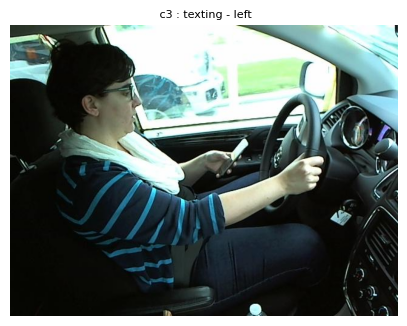

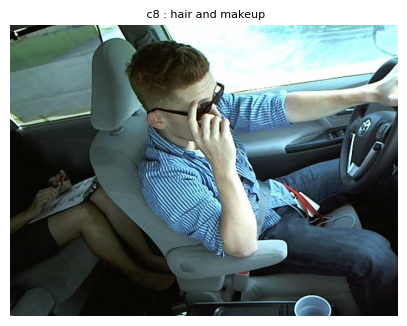

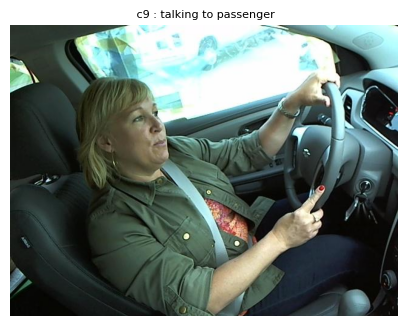

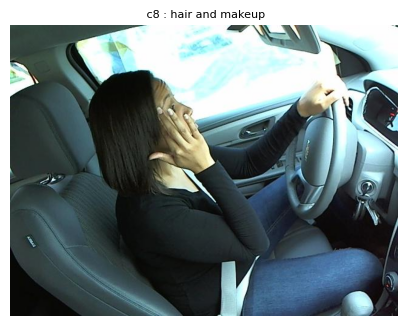

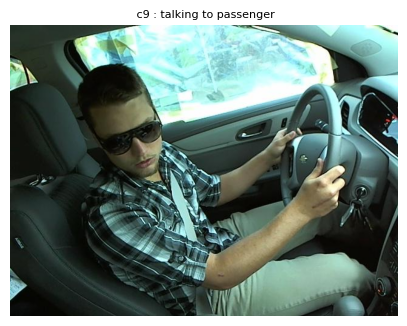

...

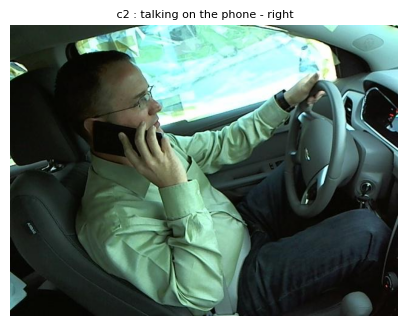

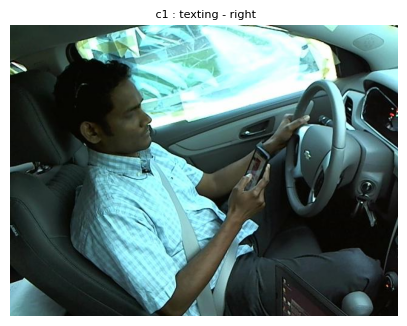

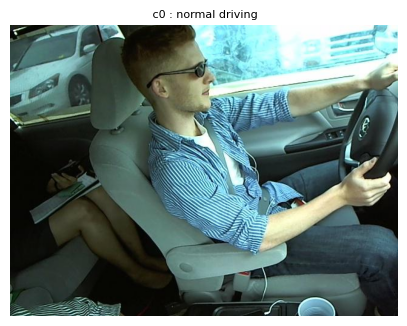

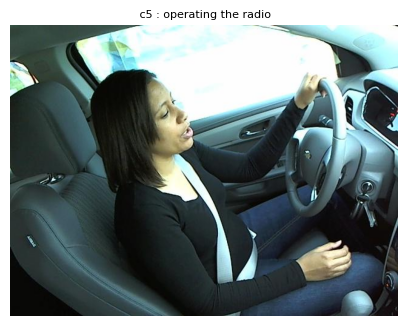

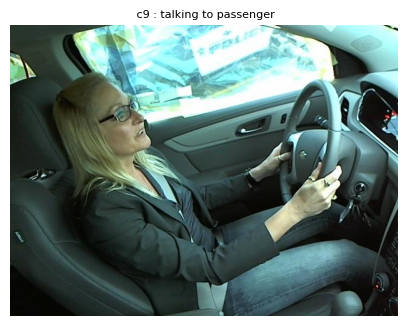

In [109]:
print("Training Images")
display_random_images(train_dir, categories, 15)

Validation Images


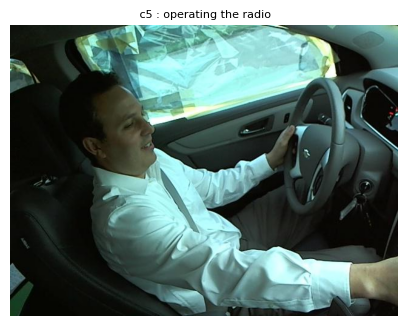

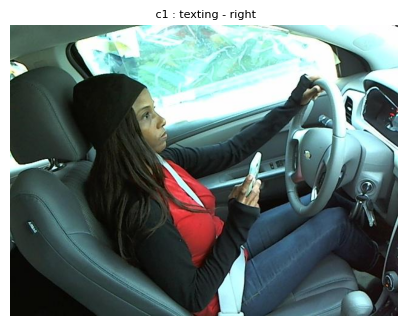

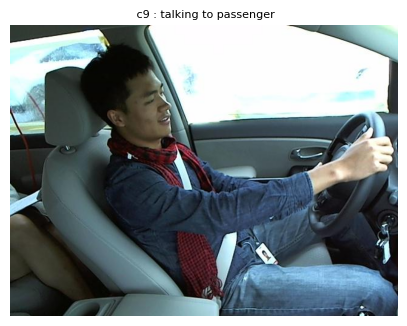

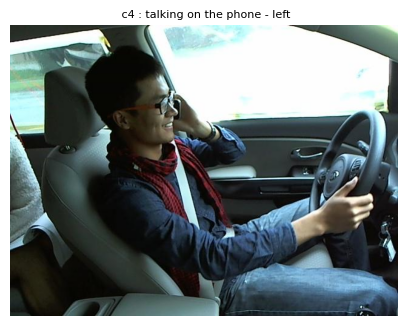

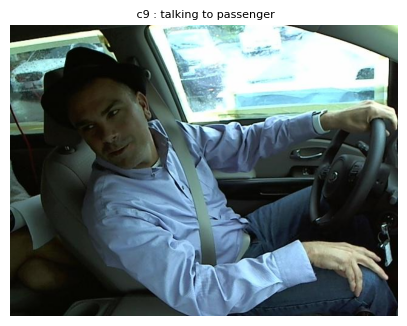

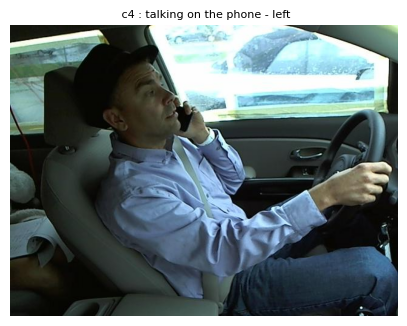

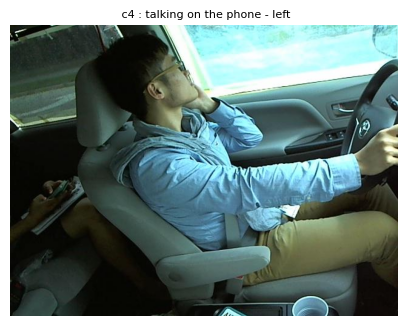

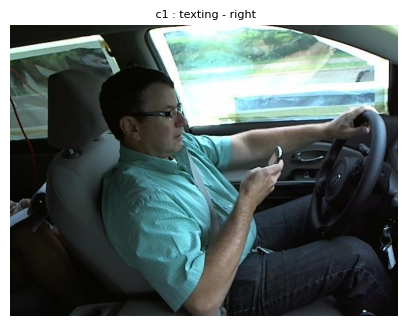

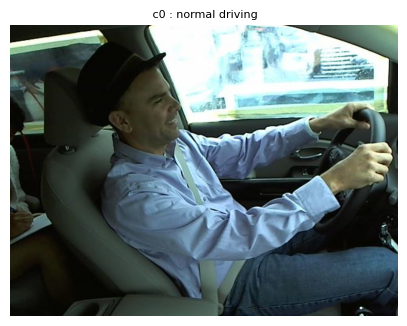

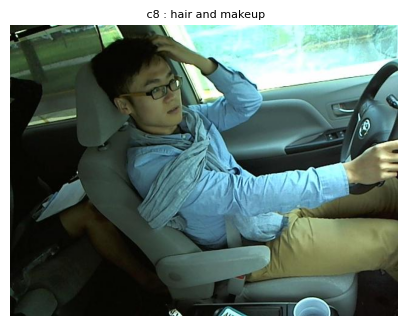

In [110]:
print("Validation Images")
display_random_images(val_dir, categories, 10)

Testing Images


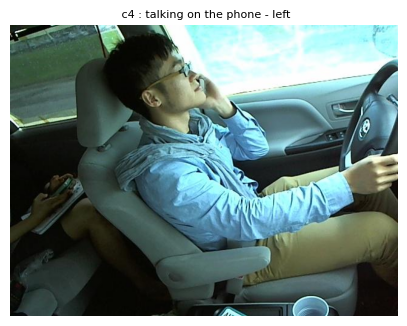

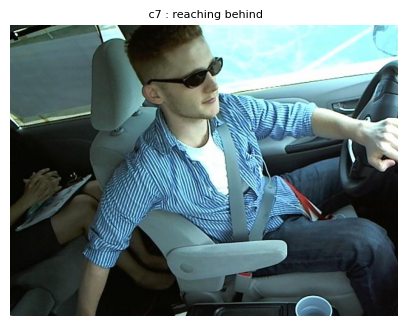

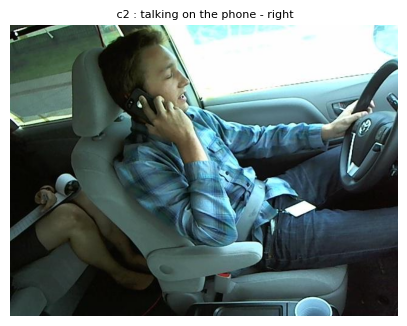

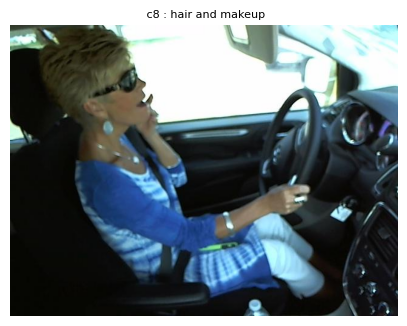

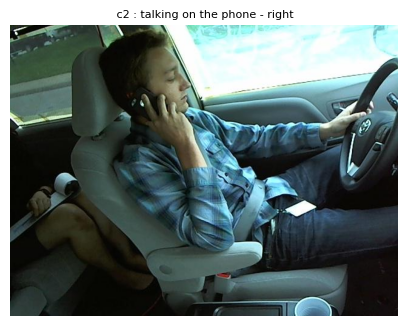

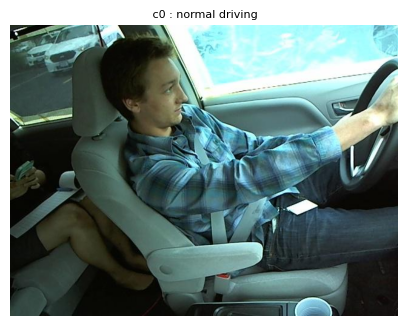

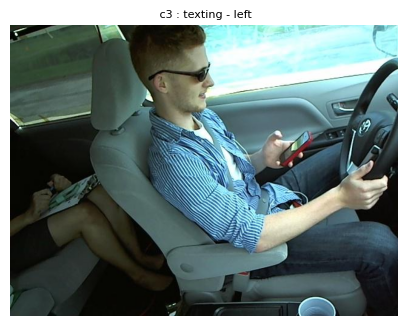

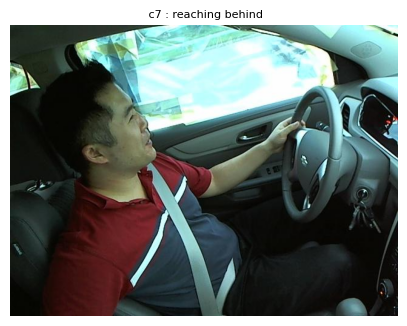

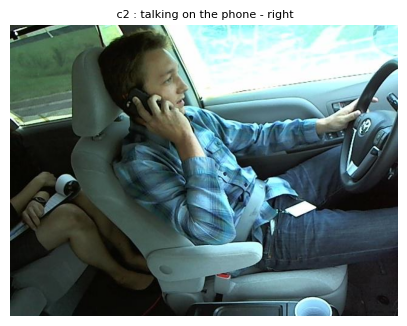

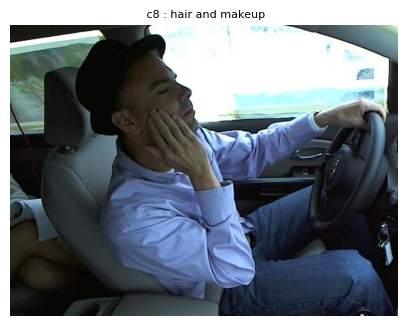

In [111]:
print("Testing Images")
display_random_images(testing_dir, categories, 10)

Test Images


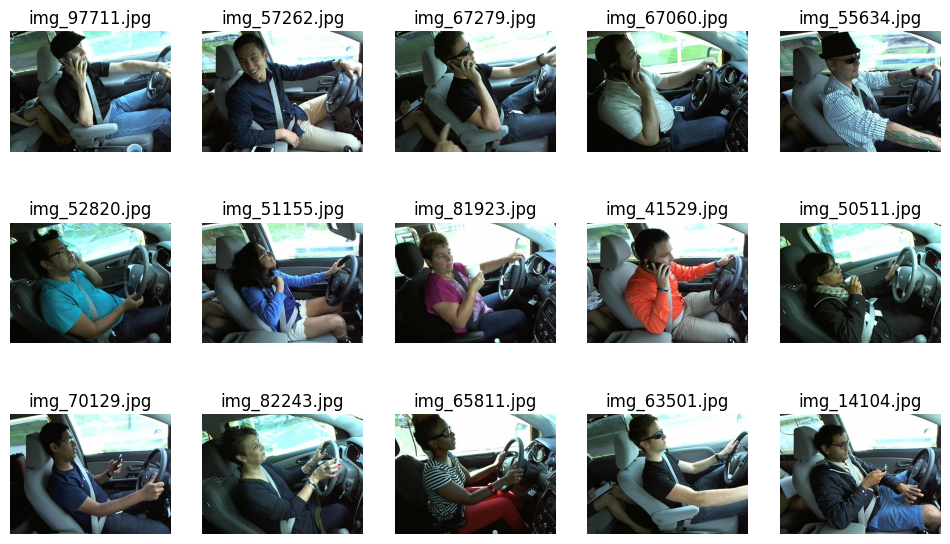

In [27]:
print("Test Images")
image_files = os.listdir(test_dir)

random_images = random.sample(image_files, 15)

# Plot the random images
plt.figure(figsize=(12, 12))
for i, img_file in enumerate(random_images):
    img_path = os.path.join(test_dir, img_file)
    img = mpimg.imread(img_path)
    plt.subplot(5, 5, i + 1)
    plt.imshow(img)
    plt.axis('off')
    plt.title(img_file)
plt.show()

## Data preprocessing:


We uses Keras's ImageDataGenerator to preprocess and load images for training, validation, and testing. Images are rescaled to [0, 1], resized to 150x150 pixels, and processed in batches of 64. The flow_from_directory method automatically loads images from directories, assigns labels based on folder names, and one-hot encodes labels for multi-class classification.

In [28]:
train_datagen = ImageDataGenerator(rescale=1./255)
validation_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

In [29]:
train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(150, 150),
    batch_size= 64,
    class_mode='categorical')

validation_generator = validation_datagen.flow_from_directory(
    val_dir,
    target_size=(150, 150),
    batch_size=64,
    class_mode='categorical')

test_generator = test_datagen.flow_from_directory(
    testing_dir,
    target_size=(150, 150),
    batch_size=64,
    class_mode='categorical')

Found 16152 images belonging to 10 classes.
Found 4481 images belonging to 10 classes.
Found 1791 images belonging to 10 classes.


We can observe the number of images and categories present in each generator.

In [30]:
images, labels = next(train_generator)
print(labels)

print("Shape of image batch:", images.shape)
print("Shape of label batch:", labels.shape)

print("Type of images:", type(images))
print("Type of labels:", type(labels))

print("Image data type:", images.dtype)
print("Label data type:", labels.dtype)

print("Number of classes (one-hot encoded label vector length):", labels.shape[1])

[[0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 1. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 1. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 1. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0. 0. 0. 0. 0.]
 [1. 0. 0. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 0. 0. 0. 1. 0. 0.]
 [0. 0. 1. 0. 0. 0. 0. 0. 0. 0.]
 [0. 0. 0. 0. 0. 0. 1. 0. 0. 0.]
 [0. 0. 1.

The batch consists of 64 images, each sized 150x150 with 3 color channels (RGB). The labels are one-hot encoded, meaning there are 10 possible classes. Both the images and labels are stored as NumPy arrays, and the labels are represented as vectors with a length of 10, showing 64 samples in total.

Lets create the function to plot the training and validation loss, accuracy Vs epochs to analyse the training process.

In [31]:
def plot_history(model):
  history_dict = model.history
  loss_values = history_dict['loss']
  val_loss_values = history_dict['val_loss']
  acc_values = history_dict['acc']
  val_acc_values = history_dict['val_acc']
  epochs = range(1, len(history_dict['acc']) + 1)

  plt.plot(epochs, loss_values, 'r', label = 'Training loss')
  plt.plot(epochs, val_loss_values, 'b', label = 'Validation loss')
  plt.title('Training and validation loss')
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

  plt.plot(epochs, acc_values, 'r', label = 'Training accuracy')
  plt.plot(epochs, val_acc_values, 'b', label = 'Validation accuracy')
  plt.title('Training and validation accuracy')
  plt.xlabel('Epochs')
  plt.ylabel('Accuracy')
  plt.legend()
  return plt.show()

# Creating models:

Lets create simple sequential model.

In [112]:
model1 = tf.keras.models.Sequential([
    Flatten(input_shape = (150, 150, 3)),
    Dense(16, activation = 'relu'),
    Dense(32, activation = 'relu'),
    BatchNormalization(),
    Dense(64, activation = 'relu'),
    Dense(128, activation = 'relu'),
    BatchNormalization(),
    Dense(256, activation = 'relu'),
    Dense(512, activation = 'relu'),
    BatchNormalization(),
    Dense(1024, activation = 'relu'),
    Dense(10, activation = 'softmax')
])

/usr/local/lib/python3.10/dist-packages/keras/src/layers/reshaping/flatten.py:37: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


In [113]:
model1.compile(optimizer = Adam(learning_rate = 0.001), loss = 'categorical_crossentropy', metrics = ['acc'])

In [114]:
model1.summary()

Model: "sequential_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ flatten_1 (Flatten)                  │ (None, 67500)               │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 16)                  │       1,080,016 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_3 (Dense)                      │ (None, 32)                  │             544 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 32)                  │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_4 (Dense)                      │ (None, 64)                  │           2,112 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_5 (Dense)                      │ (None, 128)                 │           8,320 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 128)                 │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_6 (Dense)                      │ (None, 256)                 │          33,024 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_7 (Dense)                      │ (None, 512)                 │         131,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 512)                 │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_8 (Dense)                      │ (None, 1024)                │         525,312 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_9 (Dense)                      │ (None, 10)                  │          10,250 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 1,793,850 (6.84 MB)

 Trainable params: 1,792,506 (6.84 MB)

 Non-trainable params: 1,344 (5.25 KB)

The above neural network model used for classifying images into 10 different categories. It has multiple layers that learn patterns from the data, each followed by a normalization step to help the model train faster and more accurately. The final layer gives probabilities for each category, allowing the model to predict which class the image belongs to.

We try to fit the model with "train_generator" and validate it with "validation_generator"

In [115]:
model1_history = model1.fit(train_generator,
                    epochs = 15,
                    verbose = 1,
                    validation_data = validation_generator,
                    callbacks =  EarlyStopping(monitor = "val_acc",min_delta = 0.0001,verbose=1,patience = 5,restore_best_weights = True,
                    baseline = None))

Epoch 1/15
253/253 ━━━━━━━━━━━━━━━━━━━━ 123s 392ms/step - acc: 0.3727 - loss: 1.8589 - val_acc: 0.3800 - val_loss: 1.6813
Epoch 2/15
253/253 ━━━━━━━━━━━━━━━━━━━━ 66s 256ms/step - acc: 0.8259 - loss: 0.5138 - val_acc: 0.6452 - val_loss: 1.2331
Epoch 3/15
253/253 ━━━━━━━━━━━━━━━━━━━━ 64s 249ms/step - acc: 0.8981 - loss: 0.3018 - val_acc: 0.6333 - val_loss: 1.5221
Epoch 4/15
253/253 ━━━━━━━━━━━━━━━━━━━━ 69s 267ms/step - acc: 0.9351 - loss: 0.2013 - val_acc: 0.6666 - val_loss: 1.4726
Epoch 5/15
253/253 ━━━━━━━━━━━━━━━━━━━━ 76s 243ms/step - acc: 0.9590 - loss: 0.1308 - val_acc: 0.3111 - val_loss: 5.3300
Epoch 6/15
253/253 ━━━━━━━━━━━━━━━━━━━━ 66s 256ms/step - acc: 0.9604 - loss: 0.1267 - val_acc: 0.6581 - val_loss: 1.8879
Epoch 7/15
253/253 ━━━━━━━━━━━━━━━━━━━━ 64s 249ms/step - acc: 0.9548 - loss: 0.1350 - val_acc: 0.9313 - val_loss: 0.2687
Epoch 8/15
253/253 ━━━━━━━━━━━━━━━━━━━━ 67s 260ms/step - acc: 0.9442 - loss: 0.1809 - val_acc: 0.7697 - val_loss: 0.9269
Epoch 9/15
253/253 ━━━━━━━━━━━━

In [121]:
model1.evaluate(test_generator)

28/28 ━━━━━━━━━━━━━━━━━━━━ 7s 245ms/step - acc: 0.9322 - loss: 0.2607


[0.26636043190956116, 0.9274148344993591]

The accuracy of the model is "0.9274".

Lets explore our model prediction. I used a random image from the "testing_dir" and made a prediction using a model.

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


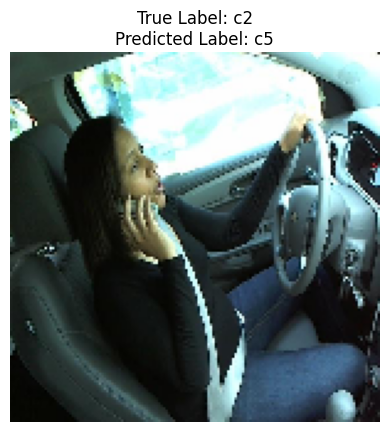

True Label: c2: talking on the phone - right
Predicted Label: c5: operating the radio


In [122]:

from keras.preprocessing import image
testing_dir = '/content/imgs/testing'

categories = os.listdir(testing_dir)

true_label = random.choice(categories)
category_dir = os.path.join(testing_dir, true_label)
image_files = os.listdir(category_dir)
image_file = random.choice(image_files)
img_path = os.path.join(category_dir, image_file)

img = image.load_img(img_path, target_size=(150, 150))
img_array = image.img_to_array(img)

img_array = np.expand_dims(img_array, axis=0)

predictions = model1.predict(img_array)

predicted_class_index = np.argmax(predictions, axis=1)[0]

predicted_label = categories[predicted_class_index]

plt.imshow(img)
plt.title(f"True Label: {true_label}\nPredicted Label: {predicted_label}")
plt.axis('off')
plt.show()

print(f"True Label: {true_label}: {names_dict[true_label]}")
print(f"Predicted Label: {predicted_label}: {names_dict[predicted_label]}")


Our model predicted that the image is "c5: operating the radio" but the true label is "c2-talking on the phone - right".





In [118]:
print(model1_history.history.keys())

dict_keys(['acc', 'loss', 'val_acc', 'val_loss'])


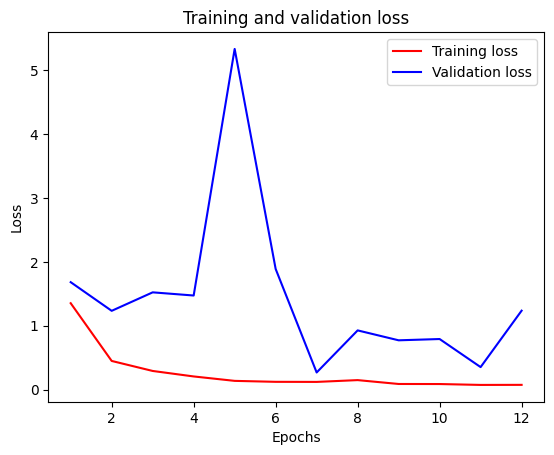

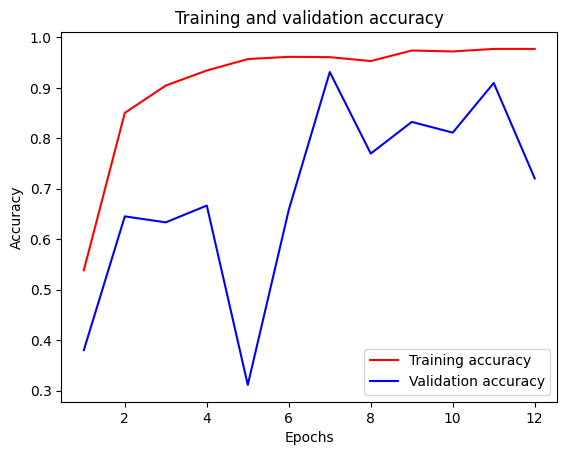

In [123]:
plot_history(model1_history)

The model is likely overfitting: training loss decreases and accuracy reaches near 100%, but validation loss fluctuates and validation accuracy is unstable. This means the model performs well on training data but struggles with new data.

Here, we create a function which includes methods for accuracy, classification report, confusion matrix and Roc curves.

In [120]:

import seaborn as sns
def metrics(model, test_generator):
    true_labels = []
    predicted_labels = []
    predictions = []


    test_generator.reset()
    num_batches = len(test_generator)

    for i in range(num_batches):
        X_batch, y_true_batch = test_generator[i]

        y_pred_batch = model.predict(X_batch, verbose=0)

        true_labels.extend(np.argmax(y_true_batch, axis=1))
        predicted_labels.extend(np.argmax(y_pred_batch, axis=1))
        predictions.extend(y_pred_batch)


    predictions = np.array(predictions)

    # Accuracy score
    accuracy = accuracy_score(true_labels, predicted_labels)
    print("Accuracy  :- {:.2f}%".format(accuracy*100))

    # Classification report
    categories = list(test_generator.class_indices.keys())  # Class names from the generator
    print("\nClassification Report:")
    print(classification_report(true_labels, predicted_labels, target_names=categories))

    # Confusion matrix
    conf_matrix = confusion_matrix(true_labels, predicted_labels)
    plt.figure(figsize=(10, 8))
    sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=categories, yticklabels=categories)
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.title('Confusion Matrix')
    plt.show()

    n_classes = len(categories)


    true_labels_bin = label_binarize(true_labels, classes=range(n_classes))

    plt.figure(figsize=(10, 8))
    colors = cycle(['aqua', 'darkorange', 'cornflowerblue', 'green', 'red', 'purple', 'yellow', 'blue', 'black', 'pink'])
    for i, color in zip(range(n_classes), colors):
        fpr, tpr, _ = roc_curve(true_labels_bin[:, i], predictions[:, i])
        roc_auc = auc(fpr, tpr)

        plt.plot(fpr, tpr, color=color, lw=2, label=f'Class {categories[i]} (AUC = {roc_auc:.2f})')

    plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Chance (AUC = 0.50)')
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('ROC Curve for Each Class')
    plt.legend(loc='lower right')
    plt.show()


Accuracy  :- 92.74%

Classification Report:
              precision    recall  f1-score   support

          c0       0.94      0.98      0.96       199
          c1       0.91      1.00      0.95       181
          c2       0.83      0.86      0.85       185
          c3       0.94      0.89      0.92       187
          c4       0.99      0.94      0.97       186
          c5       0.96      0.99      0.98       185
          c6       0.91      0.82      0.86       186
          c7       0.99      0.97      0.98       160
          c8       0.89      0.92      0.90       152
          c9       0.93      0.89      0.91       170

    accuracy                           0.93      1791
   macro avg       0.93      0.93      0.93      1791
weighted avg       0.93      0.93      0.93      1791



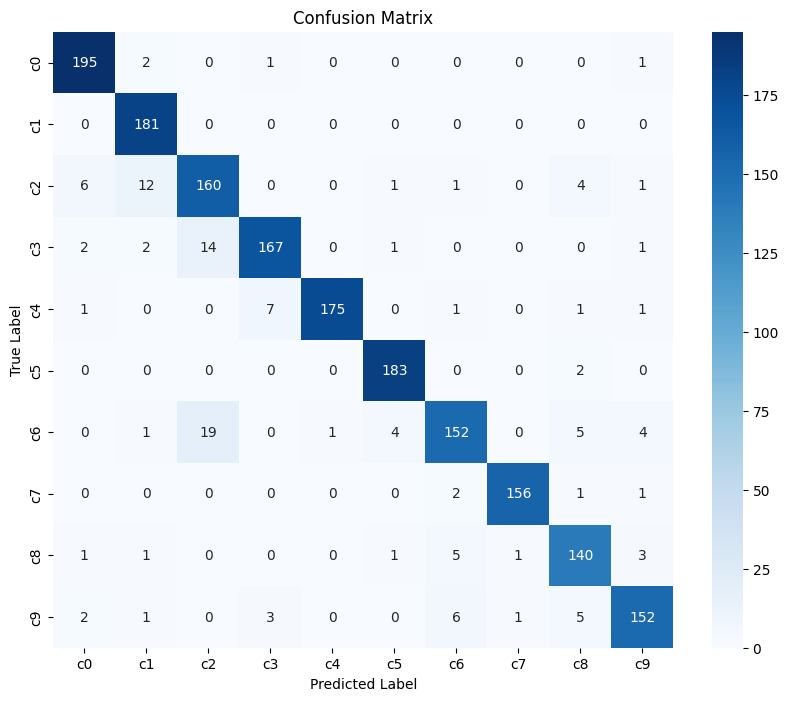

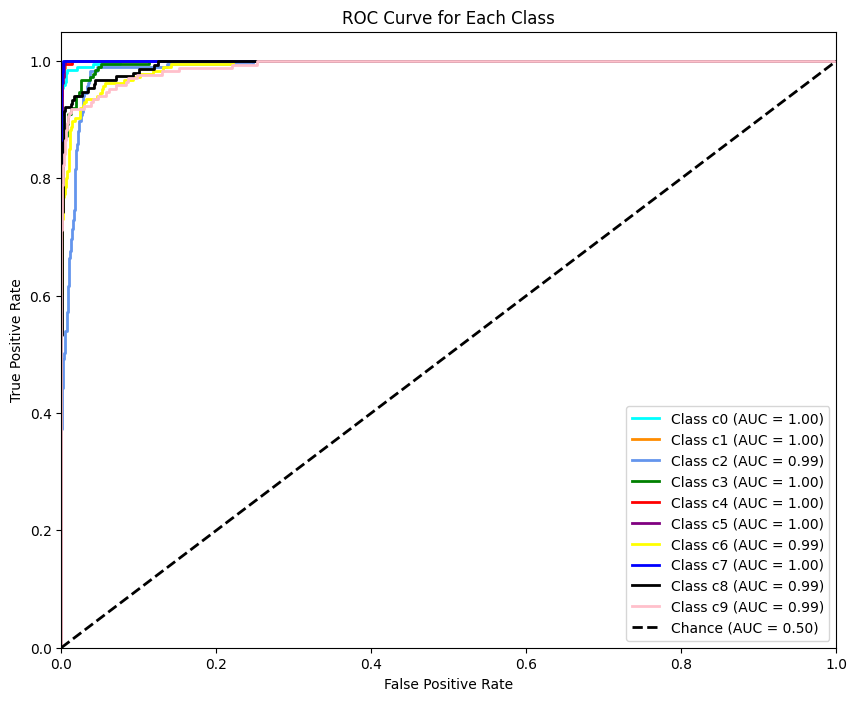

In [124]:
metrics(model1, test_generator)

**Metrics Evaluation:**

1) **Accuracy:**

The accuracy of the model is 92.74%

2) **classification Report:**

The model has an overall accuracy of 93%, meaning it correctly classifies 93% of the test samples.

Class-wise performance:
Class c1 performs best with a precision of 0.91 and perfect recall of 1.00.

Class c2 has the lowest performance, with a precision of 0.83 and f1-score of 0.85.

The macro average of 0.93 shows good balance across all classes, while the weighted average (also 0.93) confirms consistency in handling all classes, even when they have different sample sizes.

3) **Confusion Matrix:**

The confusion matrix shows the model is performing well, with most predictions correct. For example, class c0 has 195 correct out of 199, and c1 is perfectly predicted. However, classes like c2 and c6 struggle, with some images being misclassified into neighboring classes. The model could improve in distinguishing between similar categories.

4) **ROC curve:**

The ROC curve shows that the model performs exceptionally well across all classes, with AUC values close to 1.0 for each class. This indicates strong classification performance, with minimal false positives and high true positive rates for all categories.


## Data Augmentation:

Next, add data augmentation to the data which creates more images into the datasets from the previous images for better training and performance of the model.

In [46]:
train_datagen_Aug = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True)

test_datagen_AUg = ImageDataGenerator(rescale=1./255)

train_generator_aug = train_datagen_Aug.flow_from_directory(
    train_dir,
    target_size=(150, 150),
    batch_size=64,
    class_mode='categorical')

validation_generator_aug = train_datagen_Aug.flow_from_directory(
    val_dir,
    target_size=(150, 150),
    batch_size=64,
    class_mode='categorical')

test_generator_aug= test_datagen_AUg.flow_from_directory(
    testing_dir,
    target_size=(150, 150),
    batch_size=64,
    class_mode='categorical')

Found 16152 images belonging to 10 classes.
Found 4481 images belonging to 10 classes.
Found 1791 images belonging to 10 classes.


## CNN model:

Later, create CNN model for our analysis.

In [64]:
from tensorflow.keras.regularizers import l2
backend.clear_session()
cnn_model = tf.keras.models.Sequential([

    Conv2D(512, (3, 3), activation='relu', input_shape=(150, 150, 3), kernel_regularizer=l2(0.001)),
    MaxPooling2D(2, 2),
    BatchNormalization(),

    Conv2D(128, (3, 3), activation='relu', kernel_regularizer=l2(0.001)),
    MaxPooling2D(2, 2),
    BatchNormalization(),

    Conv2D(64, (3, 3), activation='relu', kernel_regularizer=l2(0.001)),
    MaxPooling2D(2, 2),
    BatchNormalization(),

    Conv2D(32, (3, 3), activation='relu', kernel_regularizer=l2(0.001)),
    MaxPooling2D(2, 2),
    BatchNormalization(),

    Flatten(),

    Dense(512, activation='relu'),
    Dropout(0.25),

    Dense(1024, activation='relu'),
    Dropout(0.25),
    BatchNormalization(),

    Dense(10, activation='softmax')
])


/usr/local/lib/python3.10/dist-packages/keras/src/layers/convolutional/base_conv.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


In [65]:
cnn_model.compile(optimizer = Adam(learning_rate = 0.001), loss = 'categorical_crossentropy', metrics = ['accuracy'])

In [66]:
cnn_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                      │ (None, 148, 148, 512)       │          14,336 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d (MaxPooling2D)         │ (None, 74, 74, 512)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization                  │ (None, 74, 74, 512)         │           2,048 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_1 (Conv2D)                    │ (None, 72, 72, 128)         │         589,952 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_1 (MaxPooling2D)       │ (None, 36, 36, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_1                │ (None, 36, 36, 128)         │             512 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_2 (Conv2D)                    │ (None, 34, 34, 64)          │          73,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_2 (MaxPooling2D)       │ (None, 17, 17, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_2                │ (None, 17, 17, 64)          │             256 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ conv2d_3 (Conv2D)                    │ (None, 15, 15, 32)          │          18,464 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ max_pooling2d_3 (MaxPooling2D)       │ (None, 7, 7, 32)            │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_3                │ (None, 7, 7, 32)            │             128 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 1568)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 512)                 │         803,328 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout (Dropout)                    │ (None, 512)                 │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 1024)                │         525,312 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dropout_1 (Dropout)                  │ (None, 1024)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ batch_normalization_4                │ (None, 1024)                │           4,096 │
│ (BatchNormalization)                 │                             │                 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_2 (Dense)                      │ (None, 10)                  │          10,2

 Total params: 2,042,474 (7.79 MB)

 Trainable params: 2,038,954 (7.78 MB)

 Non-trainable params: 3,520 (13.75 KB)


The above model is a convolutional neural network (CNN) designed for image classification. It starts with four convolutional layers that progressively extract features, followed by max pooling and batch normalization to improve learning efficiency. Regularization (L2) is applied to prevent overfitting. After feature extraction, the model uses fully connected layers with dropout to reduce overfitting, followed by a final softmax layer to predict probabilities for 10 classes. The model is compiled with the Adam optimizer and uses categorical cross-entropy for loss calculation.

We try to fit the model with "train_generator_aug" and validate it with "validation_generator_aug"



In [67]:
cnn_model_history = cnn_model.fit(train_generator_aug,
                    epochs = 15,
                    verbose = 1,
                    validation_data = validation_generator_aug,
                    callbacks =  EarlyStopping(monitor = "val_accuracy",min_delta = 0.0001,verbose=1,patience = 5,restore_best_weights = True,
                    baseline = None))

Epoch 1/15
253/253 ━━━━━━━━━━━━━━━━━━━━ 224s 838ms/step - accuracy: 0.1295 - loss: 3.1501 - val_accuracy: 0.0948 - val_loss: 3.0897
Epoch 2/15
253/253 ━━━━━━━━━━━━━━━━━━━━ 244s 788ms/step - accuracy: 0.2498 - loss: 2.3682 - val_accuracy: 0.1183 - val_loss: 3.2491
Epoch 3/15
253/253 ━━━━━━━━━━━━━━━━━━━━ 198s 768ms/step - accuracy: 0.3741 - loss: 1.9646 - val_accuracy: 0.2553 - val_loss: 3.0434
Epoch 4/15
253/253 ━━━━━━━━━━━━━━━━━━━━ 200s 778ms/step - accuracy: 0.4865 - loss: 1.6135 - val_accuracy: 0.5416 - val_loss: 1.4816
Epoch 5/15
253/253 ━━━━━━━━━━━━━━━━━━━━ 203s 784ms/step - accuracy: 0.5854 - loss: 1.3619 - val_accuracy: 0.4425 - val_loss: 1.8249
Epoch 6/15
253/253 ━━━━━━━━━━━━━━━━━━━━ 198s 771ms/step - accuracy: 0.6803 - loss: 1.1150 - val_accuracy: 0.5751 - val_loss: 1.4558
Epoch 7/15
253/253 ━━━━━━━━━━━━━━━━━━━━ 202s 772ms/step - accuracy: 0.7208 - loss: 1.0028 - val_accuracy: 0.5713 - val_loss: 1.4925
Epoch 8/15
253/253 ━━━━━━━━━━━━━━━━━━━━ 199s 775ms/step - accuracy: 0.7482 -

In [68]:
cnn_model.evaluate(test_generator)

28/28 ━━━━━━━━━━━━━━━━━━━━ 17s 607ms/step - accuracy: 0.8552 - loss: 0.7183


[0.6831796169281006, 0.8609715104103088]

The accuracy of the cnn_model is "0.8552"

In [94]:
def plot_history_aug(model):
  history_dict = model.history
  loss_values = history_dict['loss']
  val_loss_values = history_dict['val_loss']
  acc_values = history_dict['accuracy']
  val_acc_values = history_dict['val_accuracy']
  epochs = range(1, len(history_dict['accuracy']) + 1)

  plt.plot(epochs, loss_values, 'r', label = 'Training loss')
  plt.plot(epochs, val_loss_values, 'b', label = 'Validation loss')
  plt.title('Training and validation loss')
  plt.xlabel('Epochs')
  plt.ylabel('Loss')
  plt.legend()
  plt.show()

  plt.plot(epochs, acc_values, 'r', label = 'Training accuracy')
  plt.plot(epochs, val_acc_values, 'b', label = 'Validation accuracy')
  plt.title('Training and validation accuracy')
  plt.xlabel('Epochs')
  plt.ylabel('Accuracy')
  plt.legend()
  return plt.show()

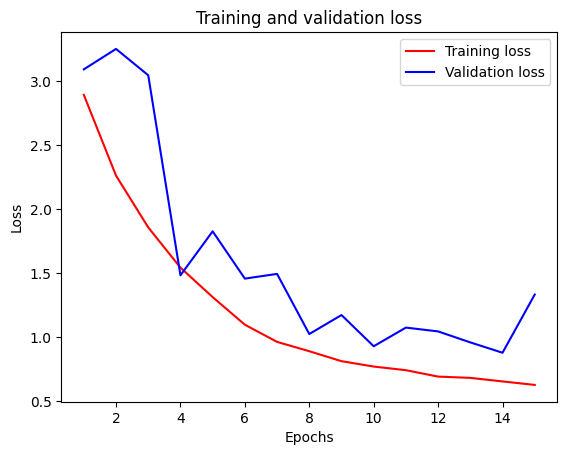

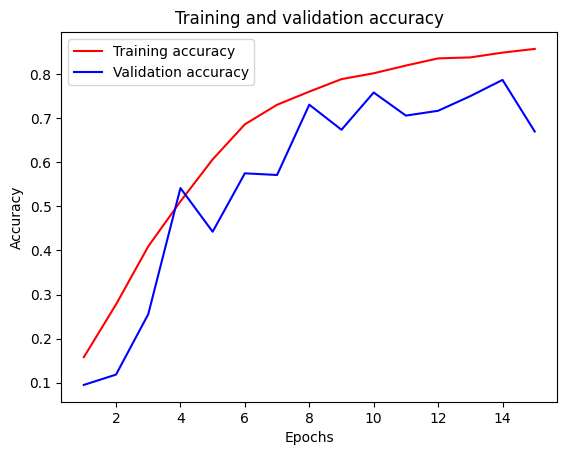

In [95]:
plot_history_aug(cnn_model_history)

From the plot, we observe that; While the validation accuracy varies, the training accuracy increases continuously, suggesting some overfitting. Validation loss increases, particularly in the last stages, while training loss gradually declines. This implies that while the model does well on training data, it has trouble generalizing, especially after a number of epochs.








1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 530ms/step


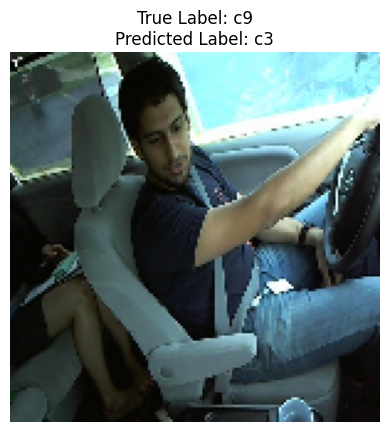

True Label: c9: talking to passenger
Predicted Label: c3: texting - left


In [69]:
from keras.preprocessing import image
testing_dir = '/content/imgs/testing'

categories = os.listdir(testing_dir)

true_label = random.choice(categories)
category_dir = os.path.join(testing_dir, true_label)
image_files = os.listdir(category_dir)
image_file = random.choice(image_files)
img_path = os.path.join(category_dir, image_file)

img = image.load_img(img_path, target_size=(150, 150))
img_array = image.img_to_array(img)

img_array = np.expand_dims(img_array, axis=0)

predictions = cnn_model.predict(img_array)

predicted_class_index = np.argmax(predictions, axis=1)[0]

predicted_label = categories[predicted_class_index]

plt.imshow(img)
plt.title(f"True Label: {true_label}\nPredicted Label: {predicted_label}")
plt.axis('off')
plt.show()

print(f"True Label: {true_label}: {names_dict[true_label]}")
print(f"Predicted Label: {predicted_label}: {names_dict[predicted_label]}")


Accuracy  :- 86.10%

Classification Report:
              precision    recall  f1-score   support

          c0       0.81      0.88      0.85       199
          c1       0.97      0.79      0.87       181
          c2       0.76      0.98      0.85       185
          c3       0.88      0.98      0.93       187
          c4       0.97      0.92      0.94       186
          c5       0.96      0.97      0.96       185
          c6       0.74      0.98      0.84       186
          c7       0.92      0.88      0.89       160
          c8       0.92      0.38      0.54       152
          c9       0.83      0.75      0.79       170

    accuracy                           0.86      1791
   macro avg       0.88      0.85      0.85      1791
weighted avg       0.87      0.86      0.85      1791



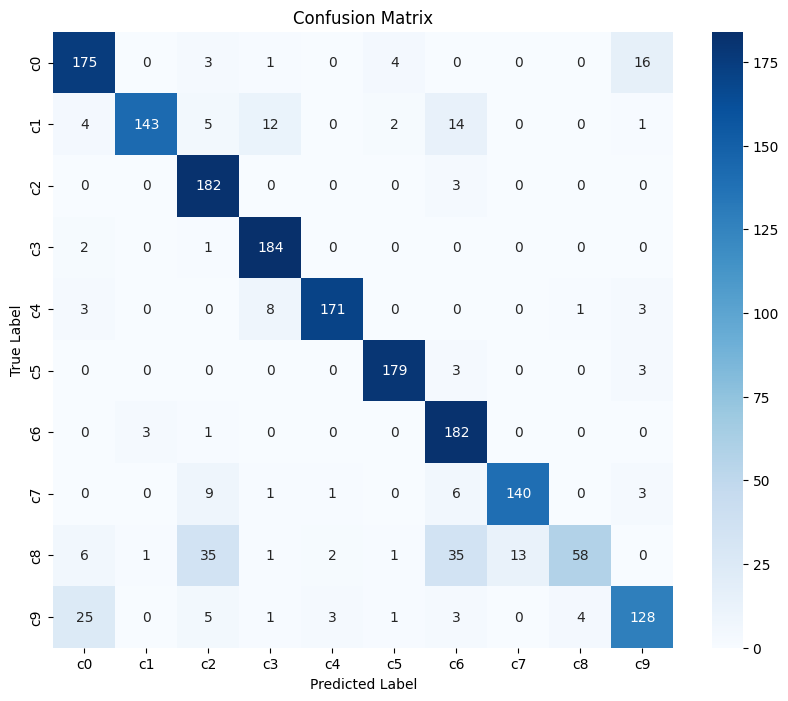

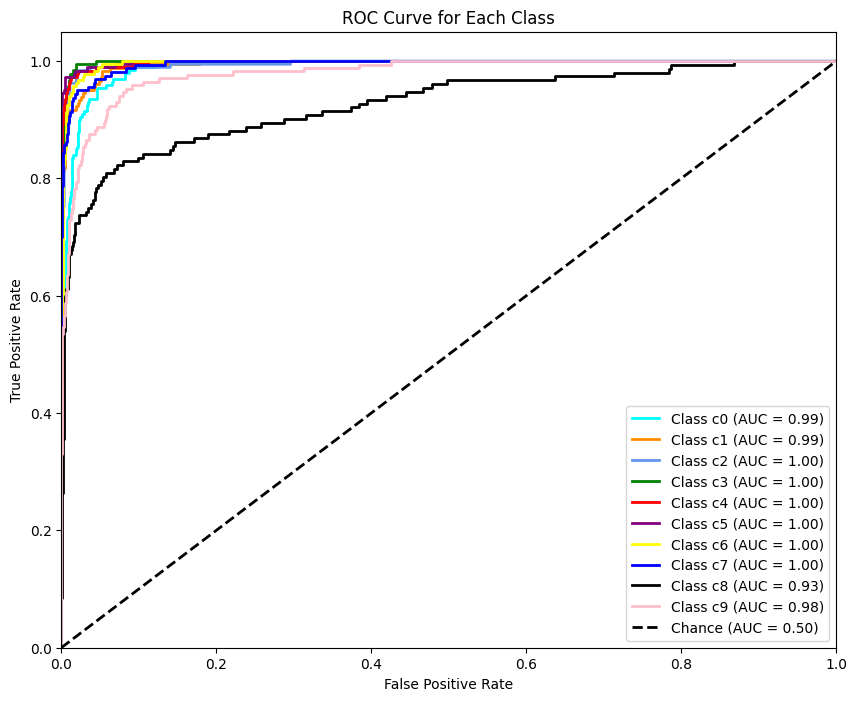

In [70]:
metrics(cnn_model, test_generator)

**Metrics Evaluation:**

1) **Accuracy:**

The accuracy of the model is 86.10%

2) **classification Report:**

The model accurately predicts classes like c1 and c5, as evidenced by their high precision and recall above 0.90. Class C8 struggles, though, as evidenced by its low f1-score of 0.54 and weak recall (0.38), which means that many actual positives were overlooked. Although the weighted averages of precision, recall, and f1-score (about 0.85-0.87) show good performance generally, they also point up areas that need work, particularly when it comes to handling class C8.

3) **Confusion Matrix:**

The confusion matrix shows strong performance for most classes, especially c0, c3, and c5. However, c8 struggles, frequently getting confused with c2, c7, and c9. Class c9 also has issues, with 25 instances misclassified as c0. Overall, the model performs well, but c8 and c9 need improvement.

4) **ROC curve:**

The ROC curve shows that the model performs exceptionally well across all classes, with AUC values close to 1.0 for each class. This indicates strong classification performance, with minimal false positives and high true positive rates for all categories.

### VGG Model(Transfer Model):

VGG-16 refers to a convolutional neural network architecture developed by Simonyan et al. It consists of 13 convolution layers and three fully connected layers, following the ReLU tradition established by AlexNet.

For the vgg model, we took VGG16 and weights from the pretained 'Imagenet'. Input shape is from the images in the directories.

In [77]:
backend.clear_session()
vgg_base = VGG16 (weights = 'imagenet',
                  include_top = False,
                  input_shape = (150, 150, 3))

The VGG model is a pre-trained model. Thus, we don't have to retrain. We are preventing the retraining of these layers here.

In [79]:
for layer in vgg_base.layers:
  layer.trainable = False
for layer in vgg_base.layers:
  print(layer, layer.trainable)

<InputLayer name=input_layer, built=True> False
<Conv2D name=block1_conv1, built=True> False
<Conv2D name=block1_conv2, built=True> False
<MaxPooling2D name=block1_pool, built=True> False
<Conv2D name=block2_conv1, built=True> False
<Conv2D name=block2_conv2, built=True> False
<MaxPooling2D name=block2_pool, built=True> False
<Conv2D name=block3_conv1, built=True> False
<Conv2D name=block3_conv2, built=True> False
<Conv2D name=block3_conv3, built=True> False
<MaxPooling2D name=block3_pool, built=True> False
<Conv2D name=block4_conv1, built=True> False
<Conv2D name=block4_conv2, built=True> False
<Conv2D name=block4_conv3, built=True> False
<MaxPooling2D name=block4_pool, built=True> False
<Conv2D name=block5_conv1, built=True> False
<Conv2D name=block5_conv2, built=True> False
<Conv2D name=block5_conv3, built=True> False
<MaxPooling2D name=block5_pool, built=True> False


In [80]:
vgg_base.summary()

Model: "vgg16"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)             │ (None, 150, 150, 3)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv1 (Conv2D)                │ (None, 150, 150, 64)        │           1,792 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_conv2 (Conv2D)                │ (None, 150, 150, 64)        │          36,928 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block1_pool (MaxPooling2D)           │ (None, 75, 75, 64)          │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv1 (Conv2D)                │ (None, 75, 75, 128)         │          73,856 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_conv2 (Conv2D)                │ (None, 75, 75, 128)         │         147,584 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block2_pool (MaxPooling2D)           │ (None, 37, 37, 128)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv1 (Conv2D)                │ (None, 37, 37, 256)         │         295,168 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv2 (Conv2D)                │ (None, 37, 37, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_conv3 (Conv2D)                │ (None, 37, 37, 256)         │         590,080 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block3_pool (MaxPooling2D)           │ (None, 18, 18, 256)         │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv1 (Conv2D)                │ (None, 18, 18, 512)         │       1,180,160 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv2 (Conv2D)                │ (None, 18, 18, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_conv3 (Conv2D)                │ (None, 18, 18, 512)         │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block4_pool (MaxPooling2D)           │ (None, 9, 9, 512)           │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv1 (Conv2D)                │ (None, 9, 9, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv2 (Conv2D)                │ (None, 9, 9, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_conv3 (Conv2D)                │ (None, 9, 9, 512)           │       2,359,808 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ block5_pool (MaxPooling2D)           │ (None, 4, 4, 512)           │               0 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 14,714,688 (56.13 MB)

 Trainable params: 0 (0.00 B)

 Non-trainable params: 14,714,688 (56.13 MB)

We observe that there are no trainable params in the model.

Later, we add flatten, output dense layers for the pre-trained vgg base.

In [82]:
from tensorflow.keras import models
from tensorflow.keras import layers
def model_vgg():
  backend.clear_session()
  modelvgg16_train = models.Sequential()
  modelvgg16_train.add(vgg_base)
  modelvgg16_train.add(layers.Flatten())
  modelvgg16_train.add(layers.Dense(512, activation = 'relu'))
  modelvgg16_train.add(layers.Dense(10, activation = 'softmax'))

  modelvgg16_train.compile('rmsprop',
    loss = 'categorical_crossentropy',
    metrics = ['accuracy'])

  return modelvgg16_train

In [83]:
vgg_model = model_vgg()

In [84]:
vgg_model.build(input_shape=(None, 150, 150, 3))

In [85]:
vgg_model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━┓
┃ Layer (type)                         ┃ Output Shape                ┃         Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)                   │ (None, 4, 4, 512)           │      14,714,688 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ flatten (Flatten)                    │ (None, 8192)                │               0 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense (Dense)                        │ (None, 512)                 │       4,194,816 │
├──────────────────────────────────────┼─────────────────────────────┼─────────────────┤
│ dense_1 (Dense)                      │ (None, 10)                  │           5,130 │
└──────────────────────────────────────┴─────────────────────────────┴─────────────────┘

 Total params: 18,914,634 (72.15 MB)

 Trainable params: 4,199,946 (16.02 MB)

 Non-trainable params: 14,714,688 (56.13 MB)

In [86]:
vgg_model_history = vgg_model.fit(train_generator_aug,
                    epochs = 15,
                    verbose = 1,
                    validation_data = validation_generator_aug,
                    callbacks =  EarlyStopping(monitor = "val_accuracy",min_delta = 0.0001,verbose=1,patience = 5,restore_best_weights = True,
                    baseline = None))

Epoch 1/15
253/253 ━━━━━━━━━━━━━━━━━━━━ 226s 813ms/step - accuracy: 0.2245 - loss: 3.3313 - val_accuracy: 0.4271 - val_loss: 1.5857
Epoch 2/15
253/253 ━━━━━━━━━━━━━━━━━━━━ 194s 748ms/step - accuracy: 0.4868 - loss: 1.4792 - val_accuracy: 0.5929 - val_loss: 1.1915
Epoch 3/15
253/253 ━━━━━━━━━━━━━━━━━━━━ 194s 753ms/step - accuracy: 0.5880 - loss: 1.1995 - val_accuracy: 0.6416 - val_loss: 1.0486
Epoch 4/15
253/253 ━━━━━━━━━━━━━━━━━━━━ 193s 749ms/step - accuracy: 0.6345 - loss: 1.0666 - val_accuracy: 0.6242 - val_loss: 1.0900
Epoch 5/15
253/253 ━━━━━━━━━━━━━━━━━━━━ 234s 912ms/step - accuracy: 0.6668 - loss: 0.9671 - val_accuracy: 0.6717 - val_loss: 0.9651
Epoch 6/15
253/253 ━━━━━━━━━━━━━━━━━━━━ 194s 751ms/step - accuracy: 0.6957 - loss: 0.8808 - val_accuracy: 0.6298 - val_loss: 1.0591
Epoch 7/15
253/253 ━━━━━━━━━━━━━━━━━━━━ 192s 744ms/step - accuracy: 0.7234 - loss: 0.8072 - val_accuracy: 0.7563 - val_loss: 0.7307
Epoch 8/15
253/253 ━━━━━━━━━━━━━━━━━━━━ 197s 764ms/step - accuracy: 0.7381 -

In [90]:
print(vgg_model_history.history.keys())

dict_keys(['accuracy', 'loss', 'val_accuracy', 'val_loss'])


In [87]:
vgg_model.evaluate(test_generator)

28/28 ━━━━━━━━━━━━━━━━━━━━ 440s 16s/step - accuracy: 0.9053 - loss: 0.3243


[0.2588876783847809, 0.9190396666526794]

The accuracy for our VGG model is "0.9190".

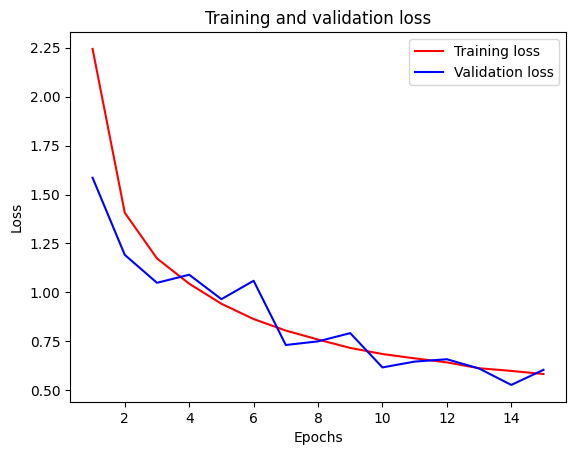

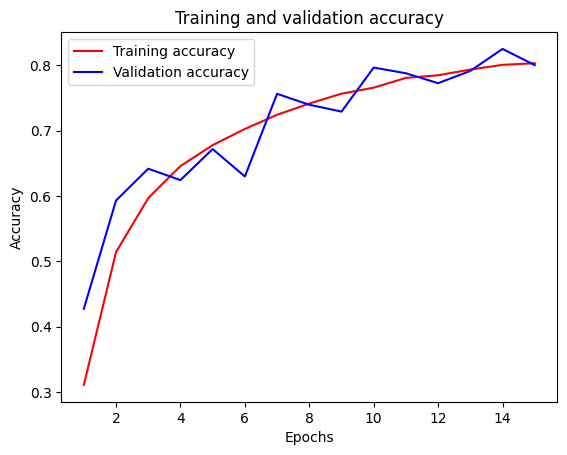

In [96]:
plot_history_aug(vgg_model_history)

The graphs show that both training and validation loss decrease consistently, indicating effective learning. Training accuracy steadily improves, while validation accuracy fluctuates slightly but generally follows the training curve. our vgg_model doesn't seem to overfit, as the validation performance aligns well with training, showing good generalization across the epochs.

Accuracy  :- 91.90%

Classification Report:
              precision    recall  f1-score   support

          c0       0.95      0.86      0.90       199
          c1       0.97      0.97      0.97       181
          c2       0.99      0.91      0.95       185
          c3       0.94      0.94      0.94       187
          c4       0.83      0.98      0.90       186
          c5       0.94      0.99      0.96       185
          c6       0.94      0.84      0.89       186
          c7       0.96      0.99      0.98       160
          c8       0.77      0.94      0.85       152
          c9       0.95      0.78      0.85       170

    accuracy                           0.92      1791
   macro avg       0.92      0.92      0.92      1791
weighted avg       0.93      0.92      0.92      1791



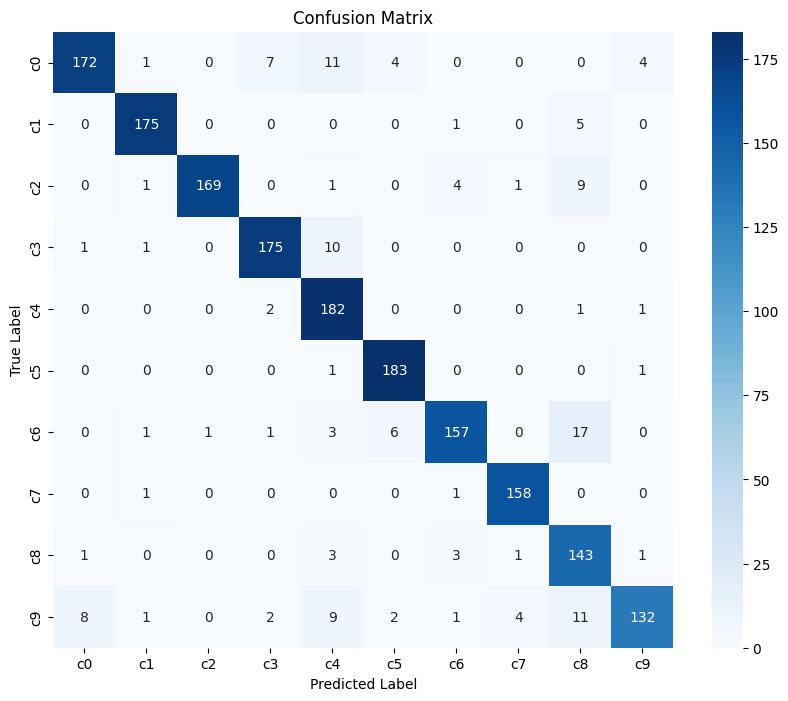

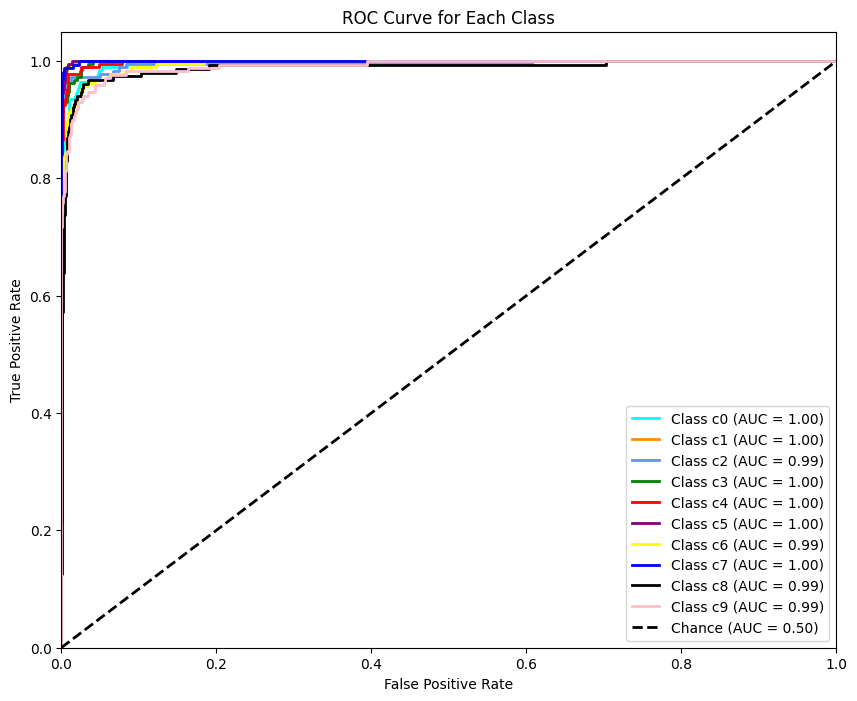

In [97]:
metrics(vgg_model, test_generator)

**Metrics Evaluation for vgg_model:**

1) **Accuracy:**

The accuracy of the model is 91.90%

2) **classification Report:**

The classification report shows strong performance overall, with an accuracy of 92%. Most classes, like c1, c5, and c7, perform very well, with high precision and recall around 0.97. However, c8 has a lower precision of 0.77, indicating more false positives for this class. The macro and weighted averages (both around 0.92) confirm the model's balanced and consistent performance across all classes.

3) **Confusion Matrix:**

With few misclassifications, the confusion matrix demonstrates that the majority of classes are correctly predicted. There is some uncertainty between classes c0 and c9; 11 c0 photographs are incorrectly classified as c4, and 17 c6 images are incorrectly classified as c8. Although it still has some confusion with class C9, class C8 performs fairly well. The majority of predictions are accurate overall, with nearly flawless predictions for C1, C5, and C7 in particular. Similar-looking classes like c0 and c4, as well as c6 and c8, might use some work.

4) **ROC curve:**

The ROC curve shows that the model performs exceptionally well across all classes, with AUC values close to 1.0 for each class. This indicates strong classification performance, with minimal false positives and high true positive rates for all categories.

Lets view our model predictions.

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 364ms/step


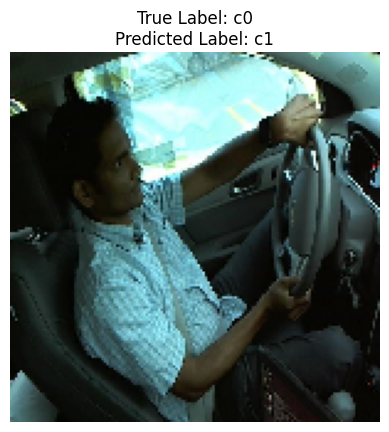

True Label: c0: normal driving
Predicted Label: c1: texting - right


In [98]:
from keras.preprocessing import image
testing_dir = '/content/imgs/testing'

categories = os.listdir(testing_dir)

true_label = random.choice(categories)
category_dir = os.path.join(testing_dir, true_label)
image_files = os.listdir(category_dir)
image_file = random.choice(image_files)
img_path = os.path.join(category_dir, image_file)

img = image.load_img(img_path, target_size=(150, 150))
img_array = image.img_to_array(img)

img_array = np.expand_dims(img_array, axis=0)

predictions = vgg_model.predict(img_array)

predicted_class_index = np.argmax(predictions, axis=1)[0]

predicted_label = categories[predicted_class_index]

plt.imshow(img)
plt.title(f"True Label: {true_label}\nPredicted Label: {predicted_label}")
plt.axis('off')
plt.show()

print(f"True Label: {true_label}: {names_dict[true_label]}")
print(f"Predicted Label: {predicted_label}: {names_dict[predicted_label]}")


## Saving our model:

However, "model1" gave more accuracy than "vgg_model"; but our vgg_model provides better accuracy, no overfitting, greater performance with all category data. So, we consider "vgg_model" as our best model.

In [101]:
vgg_model.save('vgg_model.keras')

## Optional- Kaggle output:

According to the kaggle project, the submission output should be the probabilities of the predictions for each label to every image in test directory. So, we try to predict the probabilities for all images with "vgg_model" and store them in "test_predictions.csv".

In [107]:

from tensorflow.keras.models import load_model
from tensorflow.keras.layers import Input

def predict_and_store_probabilities(model, test_dir, categories, output_file="predictions.csv"):

    image_filenames = os.listdir(test_dir)
    predictions_list = []

    for img_file in image_filenames:
        img_path = os.path.join(test_dir, img_file)

        img = image.load_img(img_path, target_size=(150, 150))
        img_array = image.img_to_array(img)
        img_array = np.expand_dims(img_array, axis=0)
        img_array /= 255.0

        probabilities = model.predict(img_array, verbose=0)[0]

        prediction_data = [img_file] + list(probabilities)
        predictions_list.append(prediction_data)


    predictions_df = pd.DataFrame(predictions_list, columns=['image'] + categories)

    predictions_df.to_csv(output_file, index=False)

    print(f"Predictions saved to {output_file}")


test_dir = '/content/imgs/test'
categories = os.listdir('/content/imgs/testing')
model =vgg_model
predict_and_store_probabilities(model, test_dir, categories, output_file="test_predictions.csv")


Predictions saved to test_predictions.csv


## summary of the methods:

1) **Data Preparation:**

Resizing and Normalizing: Each image was resized to a standard input size (150x150) and normalized (scaling pixel values between 0 and 1). The dataset was divided into training, validation, and testing sets to train the model and evaluate its performance.

2) **Data Augmentation:**
data augmentation to the data which creates more images into the datasets from the previous images for better training and performance of the model.

3) **Model Building:**

The underlying model for transfer learning was a pre-trained VGG model, most likely VGG16 or VGG19. Utilizing pre-learned features from the bigger dataset (such as ImageNet) and adapting them to our particular classification the task is made possible by this.
For feature extraction, more fully linked layers were added to the model. Batch Normalization was then applied to stabilize and speed up training. In order to minimize overfitting and guarantee that the model performs effectively when applied to unseen data, dropout layers were introduced.
A softmax activation that generates probability for every class makes up the last layer.

4) **Training and Optimization:**

The model was compiled using the Adam optimizer, known for its adaptability and effectiveness in gradient-based optimization. The loss function used was categorical cross-entropy, suitable for multi-class classification tasks.
Early stopping or monitoring validation loss may have been used to prevent overfitting by stopping training when the validation loss stops improving.
The training process involved using the training dataset to adjust the model's weights, while the validation set was used to tune the hyperparameters and assess the model's ability to generalize.

5)**Model evaluation:**

The model's performance was evaluated using several metrics, such as accuracy, precision, recall, and f1-score.
Confusion matrices provided insight into which classes the model struggled to distinguish between, identifying areas where misclassifications occurred.
The validation and test datasets were used to ensure the model performs well on unseen data.

## Summary of VGG_MODEL:

One popular convolutional neural network (CNN) architecture made especially for image classification applications is the VGG model. In this task:

* Using transfer learning, a pre-trained VGG model (VGG16 or VGG19) was
modified for our dataset.

* While later layers were optimized for the particular job at hand, the model's earlier layers—which were in responsible for extracting fundamental elements like edges and textures—were frozen to maintain previously learned information.

* To increase learning performance and efficiency, more dense layers and batch normalization were introduced. L2 regularization was used to further guarantee generalization, and dropout layers had been included to avoid overfitting.

* The model can estimate the most likely category for each input image because to the probability distribution over the classes provided by the last softmax layer.

## Analysis of results for vgg_model:

1) **loss, accuracy VS Epochs Graphs:**

The graphs show that both training and validation loss decrease consistently, indicating effective learning. Training accuracy steadily improves, while validation accuracy fluctuates slightly but generally follows the training curve. our vgg_model doesn't seem to overfit, as the validation performance aligns well with training, showing good generalization across the epochs.

2) **Accuracy:**

The accuracy of the model is 91.90%

3) **Classification report:**

Precision indicates how many predicted labels were correct. Most classes have high precision, especially c2, c1, and c3, meaning the model is accurate in its predictions.

Recall measures how well the model identifies actual positives. Class c2 has excellent recall (0.99), while c9 is a bit lower (0.78), meaning some true instances were missed.

F1-Score balances precision and recall, with high scores across the board, especially for c2 and c5.

4) **confusion matrix:**

With few misclassifications, the confusion matrix demonstrates that the majority of classes are correctly predicted. There is some uncertainty between classes c0 and c9; 11 c0 photographs are incorrectly classified as c4, and 17 c6 images are incorrectly classified as c8. Although it still has some confusion with class C9, class C8 performs fairly well. The majority of predictions are accurate overall, with nearly flawless predictions for C1, C5, and C7 in particular. Similar-looking classes like c0 and c4, as well as c6 and c8, might use some work.

5) **ROC curve:**
The ROC curve shows that the model performs exceptionally well across all classes, with AUC values close to 1.0 for each class. This indicates strong classification performance, with minimal false positives and high true positive rates for all categories.

## References:



*  https://www.kaggle.com/competitions/state-farm-distracted-driver-detection/overview
* Lecture notebooks from the course.  

